In [1]:
import config
import torch
import sys
sys.path.append('../util')
sys.path.append('../others_networks')
sys.path.append('../umergenet')
import time
from Trainer import Trainer
from util import measure_inference_speed, count_trainable_parameters, clear_gpu
from DatasetReader import *

from UMergeNet import ConvType, UMergeNet

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
result_path = './umergenet/'

In [2]:
# from util import compile_xls_best_results
# compile_xls_best_results(result_path, output_file="umergenet.xlsx")

In [3]:
num_classes = config.num_classes
in_channels = config.in_channels

train_loader, test_loader, val_loader = get_datasets(dataset_dir=config.dataset_path, 
                                              resolution=config.dataset_resolution, 
                                              batch_size=config.batch_size)

torch.Size([16, 3, 256, 256]) torch.Size([16, 1, 256, 256])


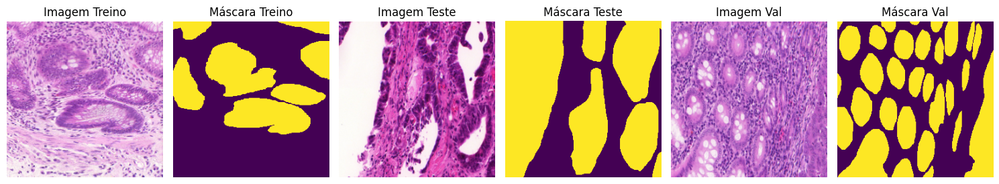

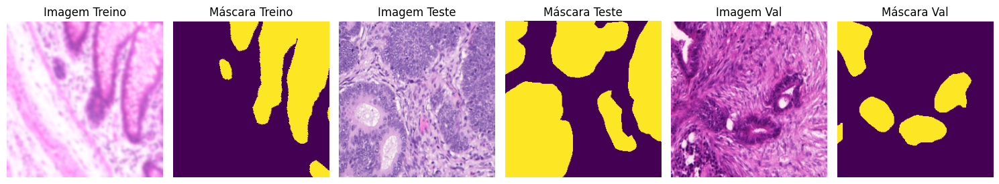

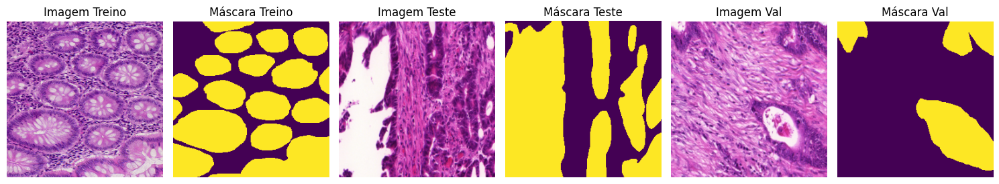

In [4]:
for (images_train, masks_train), (images_test, masks_test) in zip(train_loader, test_loader):
    print(images_train.shape, masks_train.shape)
    break

show_dataset_prev(train_loader, test_loader, val_loader, num_images=3)

In [4]:
def train(model, model_name=None,learning_rate = 1e-3,epochs = 300, re_evaluate=False):

    model_filename = f'{model_name}-epochs{epochs}.pth'

    print(count_trainable_parameters(model,format=True))
    
    trainer = Trainer(model_filename=model_filename, 
                    model_dir=result_path, 
                    info={'config':''},
                    save_xlsx=True)
    model = trainer.train(model, train_loader, val_loader, test_loader,
                            num_epochs=epochs, 
                            verbose=1, 
                            save_every=5, 
                            learning_rate=learning_rate,
                            continue_from_last=True)
    model.to(device)
    del model
    clear_gpu()
    if re_evaluate:
        trainer.evaluate_model(test_loader, print_stats=True)



# Axial

In [6]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Axial)
train(model, model_name='UMergeNet-axial-1')

1.726.801
Loss function: BCEDiceLoss
trainable_parameters: 1726801


Parando na época 50 por early stopping. 0.1841 Dice: 0.9226 mIoU: 0.8581 F1: 0.9226 IoU: 0.8532 Prec: 0.9224 Recall: 0.9232 Q: 0.7935 Time: 00:06:07 LR:0.000500

Melhor modelo:
 Epoch [30/300] - Loss: 0.0924 Val Loss: 0.1329 Dice: 0.9343 mIoU: 0.8777 F1: 0.9343 IoU: 0.8727 Prec: 0.9347 Recall: 0.9339 Q: 0.8210 Time: 00:03:41 LR:0.001000
Ultimo modelo:
 Epoch [50/300] - Loss: 0.0603 Val Loss: 0.1841 Dice: 0.9226 mIoU: 0.8581 F1: 0.9226 IoU: 0.8532 Prec: 0.9224 Recall: 0.9232 Q: 0.7935 Time: 00:06:07 LR:0.000500
 GPU_FPS: 956.5526462077911  CPU_FPS: 8.450218543399929
Saved as ./umergenet//UMergeNet-axial-1-epochs300.pth


In [7]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Axial)
train(model, model_name='UMergeNet-axial-2')

1.726.801
Loss function: BCEDiceLoss
trainable_parameters: 1726801
Parando na época 68 por early stopping. 0.2117 Dice: 0.9188 mIoU: 0.8517 F1: 0.9188 IoU: 0.8478 Prec: 0.9179 Recall: 0.9200 Q: 0.7847 Time: 00:08:25 LR:0.000500

Melhor modelo:
 Epoch [48/300] - Loss: 0.0623 Val Loss: 0.1586 Dice: 0.9309 mIoU: 0.8717 F1: 0.9309 IoU: 0.8667 Prec: 0.9307 Recall: 0.9311 Q: 0.8125 Time: 00:05:57 LR:0.001000
Ultimo modelo:
 Epoch [68/300] - Loss: 0.0471 Val Loss: 0.2117 Dice: 0.9188 mIoU: 0.8517 F1: 0.9188 IoU: 0.8478 Prec: 0.9179 Recall: 0.9200 Q: 0.7847 Time: 00:08:25 LR:0.000500
 GPU_FPS: 948.8838866579945  CPU_FPS: 8.37417719914158
Saved as ./umergenet//UMergeNet-axial-2-epochs300.pth


In [25]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Axial)
train(model, model_name='UMergeNet-axial-3')

1.726.801
Loss function: BCEDiceLoss
trainable_parameters: 1726801


Parando na época 39 por early stopping. 0.1777 Dice: 0.9213 mIoU: 0.8552 F1: 0.9213 IoU: 0.8572 Prec: 0.9209 Recall: 0.9223 Q: 0.7890 Time: 00:05:19 LR:0.000500

Melhor modelo:
 Epoch [19/300] - Loss: 0.1135 Val Loss: 0.1437 Dice: 0.9310 mIoU: 0.8713 F1: 0.9310 IoU: 0.8665 Prec: 0.9303 Recall: 0.9319 Q: 0.8115 Time: 00:02:26 LR:0.001000
Ultimo modelo:
 Epoch [39/300] - Loss: 0.0716 Val Loss: 0.1777 Dice: 0.9213 mIoU: 0.8552 F1: 0.9213 IoU: 0.8572 Prec: 0.9209 Recall: 0.9223 Q: 0.7890 Time: 00:05:19 LR:0.000500
 GPU_FPS: 965.484030615181  CPU_FPS: 7.9212727131083875
Saved as ./umergenet//UMergeNet-axial-3-epochs300.pth


# Axial DW

In [9]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Axial, encoder_groups='dw', decoder_groups='dw', merger_groups='dw')
train(model, model_name='UMergeNet-axial-dw-1')

685.497
Loss function: BCEDiceLoss
trainable_parameters: 685497
Parando na época 34 por early stopping. 0.2387 Dice: 0.9129 mIoU: 0.8420 F1: 0.9129 IoU: 0.8399 Prec: 0.9124 Recall: 0.9134 Q: 0.7709 Time: 00:03:24 LR:0.000500

Melhor modelo:
 Epoch [14/300] - Loss: 0.0834 Val Loss: 0.1800 Dice: 0.9218 mIoU: 0.8568 F1: 0.9218 IoU: 0.8540 Prec: 0.9223 Recall: 0.9223 Q: 0.7916 Time: 00:01:25 LR:0.001000
Ultimo modelo:
 Epoch [34/300] - Loss: 0.0457 Val Loss: 0.2387 Dice: 0.9129 mIoU: 0.8420 F1: 0.9129 IoU: 0.8399 Prec: 0.9124 Recall: 0.9134 Q: 0.7709 Time: 00:03:24 LR:0.000500
 GPU_FPS: 1048.2320488589683  CPU_FPS: 9.113340725345116
Saved as ./umergenet//UMergeNet-axial-dw-1-epochs300.pth


In [10]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Axial, encoder_groups='dw', decoder_groups='dw', merger_groups='dw')
train(model, model_name='UMergeNet-axial-dw-2')

685.497
Loss function: BCEDiceLoss
trainable_parameters: 685497
Parando na época 36 por early stopping. 0.2252 Dice: 0.9157 mIoU: 0.8463 F1: 0.9157 IoU: 0.8416 Prec: 0.9148 Recall: 0.9171 Q: 0.7768 Time: 00:03:43 LR:0.000250

Melhor modelo:
 Epoch [16/300] - Loss: 0.0906 Val Loss: 0.1539 Dice: 0.9266 mIoU: 0.8642 F1: 0.9266 IoU: 0.8580 Prec: 0.9258 Recall: 0.9274 Q: 0.8017 Time: 00:01:40 LR:0.001000
Ultimo modelo:
 Epoch [36/300] - Loss: 0.0412 Val Loss: 0.2252 Dice: 0.9157 mIoU: 0.8463 F1: 0.9157 IoU: 0.8416 Prec: 0.9148 Recall: 0.9171 Q: 0.7768 Time: 00:03:43 LR:0.000250
 GPU_FPS: 1050.118361343223  CPU_FPS: 9.271559469267112
Saved as ./umergenet//UMergeNet-axial-dw-2-epochs300.pth


In [11]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Axial, encoder_groups='dw', decoder_groups='dw', merger_groups='dw')
train(model, model_name='UMergeNet-axial-dw-3')

685.497
Loss function: BCEDiceLoss
trainable_parameters: 685497
Parando na época 32 por early stopping. 0.2036 Dice: 0.9196 mIoU: 0.8528 F1: 0.9196 IoU: 0.8475 Prec: 0.9191 Recall: 0.9205 Q: 0.7859 Time: 00:03:16 LR:0.000500

Melhor modelo:
 Epoch [12/300] - Loss: 0.0964 Val Loss: 0.1547 Dice: 0.9236 mIoU: 0.8596 F1: 0.9236 IoU: 0.8552 Prec: 0.9237 Recall: 0.9239 Q: 0.7956 Time: 00:01:14 LR:0.001000
Ultimo modelo:
 Epoch [32/300] - Loss: 0.0484 Val Loss: 0.2036 Dice: 0.9196 mIoU: 0.8528 F1: 0.9196 IoU: 0.8475 Prec: 0.9191 Recall: 0.9205 Q: 0.7859 Time: 00:03:16 LR:0.000500
 GPU_FPS: 1128.7906882863485  CPU_FPS: 10.400693701282247
Saved as ./umergenet//UMergeNet-axial-dw-3-epochs300.pth


# Atrous

In [12]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Atrous)
train(model, model_name='UMergeNet-atrous-1')

2.487.385
Loss function: BCEDiceLoss
trainable_parameters: 2487385
Parando na época 41 por early stopping. 0.1474 Dice: 0.9302 mIoU: 0.8703 F1: 0.9302 IoU: 0.8652 Prec: 0.9304 Recall: 0.9306 Q: 0.8104 Time: 00:05:05 LR:0.000500

Melhor modelo:
 Epoch [21/300] - Loss: 0.1193 Val Loss: 0.1345 Dice: 0.9314 mIoU: 0.8726 F1: 0.9314 IoU: 0.8674 Prec: 0.9317 Recall: 0.9318 Q: 0.8138 Time: 00:02:37 LR:0.001000
Ultimo modelo:
 Epoch [41/300] - Loss: 0.0755 Val Loss: 0.1474 Dice: 0.9302 mIoU: 0.8703 F1: 0.9302 IoU: 0.8652 Prec: 0.9304 Recall: 0.9306 Q: 0.8104 Time: 00:05:05 LR:0.000500
 GPU_FPS: 967.2234409005088  CPU_FPS: 7.573665498339487
Saved as ./umergenet//UMergeNet-atrous-1-epochs300.pth


In [13]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Atrous)
train(model, model_name='UMergeNet-atrous-2')

2.487.385
Loss function: BCEDiceLoss
trainable_parameters: 2487385
Parando na época 49 por early stopping. 0.2458 Dice: 0.9075 mIoU: 0.8333 F1: 0.9075 IoU: 0.8304 Prec: 0.9064 Recall: 0.9091 Q: 0.7591 Time: 00:06:04 LR:0.000250

Melhor modelo:
 Epoch [29/300] - Loss: 0.0786 Val Loss: 0.1863 Dice: 0.9186 mIoU: 0.8523 F1: 0.9186 IoU: 0.8490 Prec: 0.9184 Recall: 0.9189 Q: 0.7859 Time: 00:03:35 LR:0.000500
Ultimo modelo:
 Epoch [49/300] - Loss: 0.0595 Val Loss: 0.2458 Dice: 0.9075 mIoU: 0.8333 F1: 0.9075 IoU: 0.8304 Prec: 0.9064 Recall: 0.9091 Q: 0.7591 Time: 00:06:04 LR:0.000250
 GPU_FPS: 967.5162769239641  CPU_FPS: 7.29129142571552
Saved as ./umergenet//UMergeNet-atrous-2-epochs300.pth


In [14]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Atrous)
train(model, model_name='UMergeNet-atrous-3')

2.487.385
Loss function: BCEDiceLoss
trainable_parameters: 2487385
Parando na época 52 por early stopping. 0.1979 Dice: 0.9187 mIoU: 0.8516 F1: 0.9187 IoU: 0.8472 Prec: 0.9185 Recall: 0.9189 Q: 0.7844 Time: 00:06:27 LR:0.000250

Melhor modelo:
 Epoch [32/300] - Loss: 0.0838 Val Loss: 0.1592 Dice: 0.9263 mIoU: 0.8644 F1: 0.9263 IoU: 0.8592 Prec: 0.9264 Recall: 0.9264 Q: 0.8024 Time: 00:03:58 LR:0.000500
Ultimo modelo:
 Epoch [52/300] - Loss: 0.0629 Val Loss: 0.1979 Dice: 0.9187 mIoU: 0.8516 F1: 0.9187 IoU: 0.8472 Prec: 0.9185 Recall: 0.9189 Q: 0.7844 Time: 00:06:27 LR:0.000250
 GPU_FPS: 972.4935731157709  CPU_FPS: 7.5682844829948674
Saved as ./umergenet//UMergeNet-atrous-3-epochs300.pth


# Atrous DW

In [15]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Atrous, encoder_groups='dw', decoder_groups='dw', merger_groups='dw')
train(model, model_name='UMergeNet-atrous-dw-1')

701.513
Loss function: BCEDiceLoss
trainable_parameters: 701513
Parando na época 29 por early stopping. 0.2577 Dice: 0.9034 mIoU: 0.8259 F1: 0.9034 IoU: 0.8207 Prec: 0.9024 Recall: 0.9047 Q: 0.7483 Time: 00:02:37 LR:0.000500

Melhor modelo:
 Epoch [9/300] - Loss: 0.0978 Val Loss: 0.1776 Dice: 0.9138 mIoU: 0.8432 F1: 0.9138 IoU: 0.8378 Prec: 0.9131 Recall: 0.9148 Q: 0.7724 Time: 00:00:49 LR:0.001000
Ultimo modelo:
 Epoch [29/300] - Loss: 0.0468 Val Loss: 0.2577 Dice: 0.9034 mIoU: 0.8259 F1: 0.9034 IoU: 0.8207 Prec: 0.9024 Recall: 0.9047 Q: 0.7483 Time: 00:02:37 LR:0.000500
 GPU_FPS: 1354.038658649772  CPU_FPS: 10.597224588693292
Saved as ./umergenet//UMergeNet-atrous-dw-1-epochs300.pth


In [16]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Atrous, encoder_groups='dw', decoder_groups='dw', merger_groups='dw')
train(model, model_name='UMergeNet-atrous-dw-2')

701.513
Loss function: BCEDiceLoss
trainable_parameters: 701513
Parando na época 36 por early stopping. 0.2726 Dice: 0.9000 mIoU: 0.8206 F1: 0.9000 IoU: 0.8157 Prec: 0.8994 Recall: 0.9006 Q: 0.7410 Time: 00:03:17 LR:0.000500

Melhor modelo:
 Epoch [16/300] - Loss: 0.0736 Val Loss: 0.2216 Dice: 0.9059 mIoU: 0.8302 F1: 0.9059 IoU: 0.8260 Prec: 0.9060 Recall: 0.9060 Q: 0.7544 Time: 00:01:27 LR:0.001000
Ultimo modelo:
 Epoch [36/300] - Loss: 0.0426 Val Loss: 0.2726 Dice: 0.9000 mIoU: 0.8206 F1: 0.9000 IoU: 0.8157 Prec: 0.8994 Recall: 0.9006 Q: 0.7410 Time: 00:03:17 LR:0.000500
 GPU_FPS: 1315.3442571540572  CPU_FPS: 9.94760395207163
Saved as ./umergenet//UMergeNet-atrous-dw-2-epochs300.pth


In [17]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Atrous, encoder_groups='dw', decoder_groups='dw', merger_groups='dw')
train(model, model_name='UMergeNet-atrous-dw-3')

701.513
Loss function: BCEDiceLoss
trainable_parameters: 701513
Parando na época 39 por early stopping. 0.2641 Dice: 0.9057 mIoU: 0.8304 F1: 0.9057 IoU: 0.8258 Prec: 0.9055 Recall: 0.9059 Q: 0.7550 Time: 00:03:34 LR:0.000500

Melhor modelo:
 Epoch [19/300] - Loss: 0.0738 Val Loss: 0.1855 Dice: 0.9156 mIoU: 0.8457 F1: 0.9156 IoU: 0.8391 Prec: 0.9148 Recall: 0.9167 Q: 0.7757 Time: 00:01:45 LR:0.001000
Ultimo modelo:
 Epoch [39/300] - Loss: 0.0397 Val Loss: 0.2641 Dice: 0.9057 mIoU: 0.8304 F1: 0.9057 IoU: 0.8258 Prec: 0.9055 Recall: 0.9059 Q: 0.7550 Time: 00:03:34 LR:0.000500
 GPU_FPS: 1335.23406287306  CPU_FPS: 10.54014881478253
Saved as ./umergenet//UMergeNet-atrous-dw-3-epochs300.pth


# Normal

In [18]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Normal)
train(model, model_name='UMergeNet-normal-1')

4.150.297
Loss function: BCEDiceLoss
trainable_parameters: 4150297
Parando na época 54 por early stopping. 0.2009 Dice: 0.9207 mIoU: 0.8554 F1: 0.9207 IoU: 0.8531 Prec: 0.9204 Recall: 0.9211 Q: 0.7900 Time: 00:08:05 LR:0.000250

Melhor modelo:
 Epoch [34/300] - Loss: 0.0830 Val Loss: 0.1712 Dice: 0.9247 mIoU: 0.8615 F1: 0.9247 IoU: 0.8574 Prec: 0.9243 Recall: 0.9251 Q: 0.7983 Time: 00:05:06 LR:0.000500
Ultimo modelo:
 Epoch [54/300] - Loss: 0.0636 Val Loss: 0.2009 Dice: 0.9207 mIoU: 0.8554 F1: 0.9207 IoU: 0.8531 Prec: 0.9204 Recall: 0.9211 Q: 0.7900 Time: 00:08:05 LR:0.000250
 GPU_FPS: 808.9011245977123  CPU_FPS: 6.814851733592162
Saved as ./umergenet//UMergeNet-normal-1-epochs300.pth


In [19]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Normal)
train(model, model_name='UMergeNet-normal-2')

4.150.297
Loss function: BCEDiceLoss
trainable_parameters: 4150297
Parando na época 37 por early stopping. 0.1537 Dice: 0.9277 mIoU: 0.8667 F1: 0.9277 IoU: 0.8615 Prec: 0.9277 Recall: 0.9277 Q: 0.8056 Time: 00:05:32 LR:0.000500

Melhor modelo:
 Epoch [17/300] - Loss: 0.1126 Val Loss: 0.1313 Dice: 0.9352 mIoU: 0.8792 F1: 0.9352 IoU: 0.8732 Prec: 0.9354 Recall: 0.9356 Q: 0.8230 Time: 00:02:33 LR:0.001000
Ultimo modelo:
 Epoch [37/300] - Loss: 0.0689 Val Loss: 0.1537 Dice: 0.9277 mIoU: 0.8667 F1: 0.9277 IoU: 0.8615 Prec: 0.9277 Recall: 0.9277 Q: 0.8056 Time: 00:05:32 LR:0.000500
 GPU_FPS: 781.1894861825716  CPU_FPS: 6.526467993896468
Saved as ./umergenet//UMergeNet-normal-2-epochs300.pth


In [20]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Normal)
train(model, model_name='UMergeNet-normal-3')

4.150.297
Loss function: BCEDiceLoss
trainable_parameters: 4150297
Parando na época 42 por early stopping. 0.2031 Dice: 0.9187 mIoU: 0.8522 F1: 0.9187 IoU: 0.8490 Prec: 0.9182 Recall: 0.9193 Q: 0.7856 Time: 00:06:19 LR:0.000500

Melhor modelo:
 Epoch [22/300] - Loss: 0.1026 Val Loss: 0.1516 Dice: 0.9259 mIoU: 0.8629 F1: 0.9259 IoU: 0.8570 Prec: 0.9273 Recall: 0.9259 Q: 0.7998 Time: 00:03:18 LR:0.001000
Ultimo modelo:
 Epoch [42/300] - Loss: 0.0646 Val Loss: 0.2031 Dice: 0.9187 mIoU: 0.8522 F1: 0.9187 IoU: 0.8490 Prec: 0.9182 Recall: 0.9193 Q: 0.7856 Time: 00:06:19 LR:0.000500
 GPU_FPS: 787.0991895473898  CPU_FPS: 7.114861852615861
Saved as ./umergenet//UMergeNet-normal-3-epochs300.pth


# Normal DW

In [21]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Normal, encoder_groups='dw', decoder_groups='dw', merger_groups='dw')
train(model, model_name='UMergeNet-normal-dw-1')

739.913
Loss function: BCEDiceLoss
trainable_parameters: 739913
Parando na época 28 por early stopping. 0.2292 Dice: 0.9124 mIoU: 0.8406 F1: 0.9124 IoU: 0.8363 Prec: 0.9113 Recall: 0.9139 Q: 0.7686 Time: 00:02:52 LR:0.000500

Melhor modelo:
 Epoch [8/300] - Loss: 0.1148 Val Loss: 0.1597 Dice: 0.9233 mIoU: 0.8587 F1: 0.9233 IoU: 0.8527 Prec: 0.9231 Recall: 0.9241 Q: 0.7941 Time: 00:00:49 LR:0.001000
Ultimo modelo:
 Epoch [28/300] - Loss: 0.0459 Val Loss: 0.2292 Dice: 0.9124 mIoU: 0.8406 F1: 0.9124 IoU: 0.8363 Prec: 0.9113 Recall: 0.9139 Q: 0.7686 Time: 00:02:52 LR:0.000500
 GPU_FPS: 1168.6146344861213  CPU_FPS: 10.096245279575646
Saved as ./umergenet//UMergeNet-normal-dw-1-epochs300.pth


In [22]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Normal, encoder_groups='dw', decoder_groups='dw', merger_groups='dw')
train(model, model_name='UMergeNet-normal-dw-2')

739.913
Loss function: BCEDiceLoss
trainable_parameters: 739913
Parando na época 34 por early stopping. 0.2337 Dice: 0.9145 mIoU: 0.8441 F1: 0.9145 IoU: 0.8367 Prec: 0.9140 Recall: 0.9152 Q: 0.7736 Time: 00:03:29 LR:0.000500

Melhor modelo:
 Epoch [14/300] - Loss: 0.0789 Val Loss: 0.1621 Dice: 0.9255 mIoU: 0.8624 F1: 0.9255 IoU: 0.8572 Prec: 0.9261 Recall: 0.9249 Q: 0.7992 Time: 00:01:27 LR:0.001000
Ultimo modelo:
 Epoch [34/300] - Loss: 0.0416 Val Loss: 0.2337 Dice: 0.9145 mIoU: 0.8441 F1: 0.9145 IoU: 0.8367 Prec: 0.9140 Recall: 0.9152 Q: 0.7736 Time: 00:03:29 LR:0.000500
 GPU_FPS: 1215.6301784258671  CPU_FPS: 10.191674456218417
Saved as ./umergenet//UMergeNet-normal-dw-2-epochs300.pth


In [23]:
model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Normal, encoder_groups='dw', decoder_groups='dw', merger_groups='dw')
train(model, model_name='UMergeNet-normal-dw-3')

739.913
Loss function: BCEDiceLoss
trainable_parameters: 739913
Parando na época 28 por early stopping. 0.2286 Dice: 0.9107 mIoU: 0.8375 F1: 0.9107 IoU: 0.8329 Prec: 0.9096 Recall: 0.9126 Q: 0.7643 Time: 00:02:52 LR:0.000500

Melhor modelo:
 Epoch [8/300] - Loss: 0.1158 Val Loss: 0.1475 Dice: 0.9246 mIoU: 0.8605 F1: 0.9246 IoU: 0.8554 Prec: 0.9259 Recall: 0.9241 Q: 0.7963 Time: 00:00:49 LR:0.001000
Ultimo modelo:
 Epoch [28/300] - Loss: 0.0462 Val Loss: 0.2286 Dice: 0.9107 mIoU: 0.8375 F1: 0.9107 IoU: 0.8329 Prec: 0.9096 Recall: 0.9126 Q: 0.7643 Time: 00:02:52 LR:0.000500
 GPU_FPS: 1190.8024700120661  CPU_FPS: 10.142939730934737
Saved as ./umergenet//UMergeNet-normal-dw-3-epochs300.pth


In [24]:
import os
os.system('play -nq -t alsa synth 0.2 sine 600; play -nq -t alsa synth 0.2 sine 600')
os.system('play -nq -t alsa synth 0.2 sine 600; play -nq -t alsa synth 0.2 sine 600')
os.system('play -nq -t alsa synth 0.2 sine 600; play -nq -t alsa synth 0.2 sine 600')

0

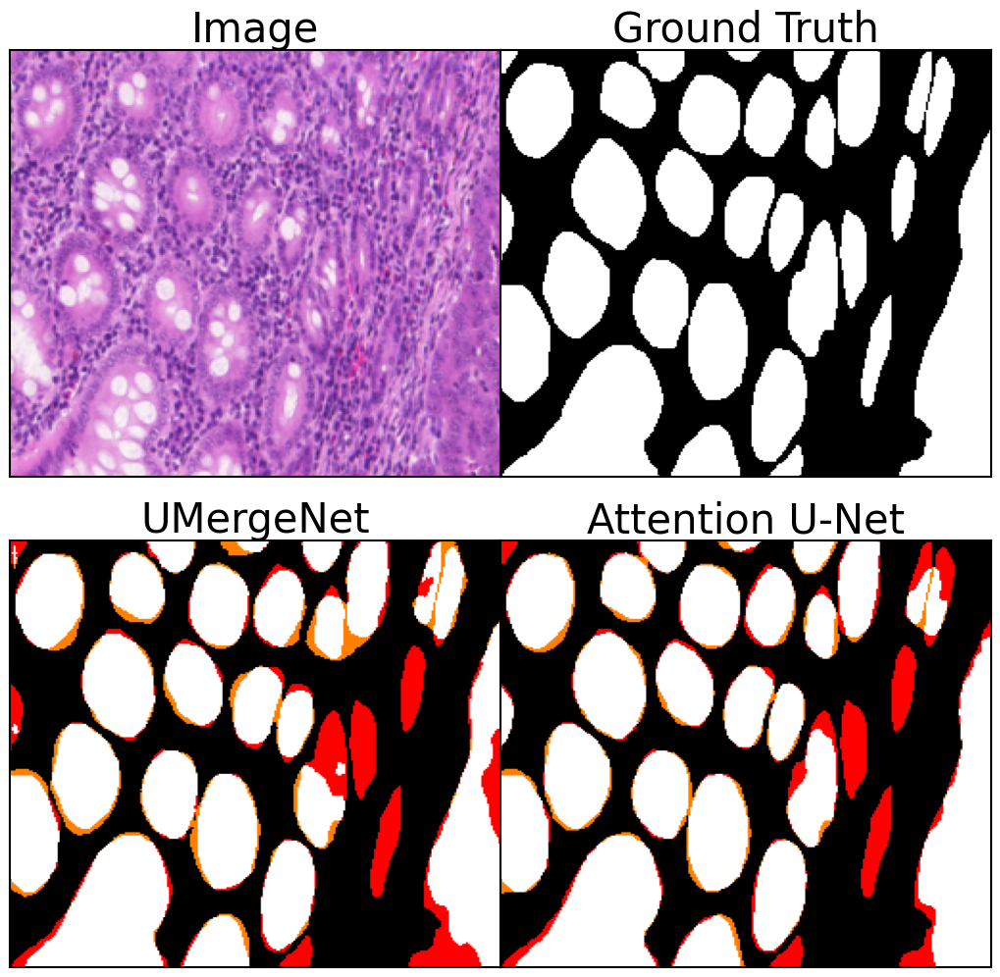

In [23]:
from ImageComparisonGenerator import ImageComparisonGenerator, load_model

model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Axial)
model1 = load_model(model,"./umergenet/UMergeNet-axial-1-epochs300.pth")


import sys
sys.path.append("/mnt/TUDAO/Image_Segmentation")
from network import AttU_Net

model = AttU_Net(img_ch=in_channels, output_ch=num_classes)
model2 = load_model(model,"./LeeJunUNets/AttU_Net-1-best.pth")

icg = ImageComparisonGenerator(model=model1, model_name1="UMergeNet", model2=model2, model_name2="Attention U-Net")
sample = 0
icg.save_output_quad(val_loader, samples=[sample], do_diff=True, invert_diff_colors=True, do_save=f'glas-quad-{sample}.eps')

#predict_and_show_mask(model, val_loader,0)

/mnt/TUDAO/0UMergeNet/glas/../util/ImageComparisonGenerator.py:271: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.96])


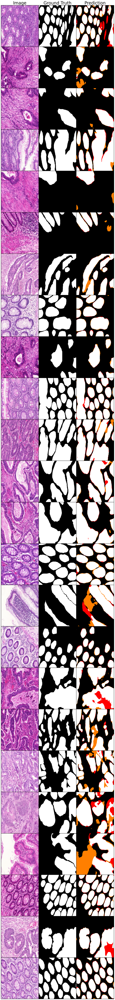

In [16]:

from ImageComparisonGenerator import ImageComparisonGenerator, load_model


model = UMergeNet(in_channels=in_channels, out_channels=num_classes, conv_type=ConvType.Axial)
model1 = load_model(model,"./umergenet/UMergeNet-axial-1-epochs300.pth")

icg = ImageComparisonGenerator(model)
icg.save_output_row(val_loader, samples=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23], do_diff=True, invert_diff_colors=True)
#icg.save_output_row(test_loader, samples=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24], do_diff=True, invert_diff_colors=True)

#predict_and_show_mask(model, val_loader,0)